In [22]:
# Use a pipeline as a high-level helper
from transformers import pipeline

pipe = pipeline("image-to-text", model="Salesforce/blip-image-captioning-base")

In [23]:
# Load model directly
from transformers import AutoProcessor, AutoModelForImageTextToText

processor = AutoProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = AutoModelForImageTextToText.from_pretrained("Salesforce/blip-image-captioning-base")

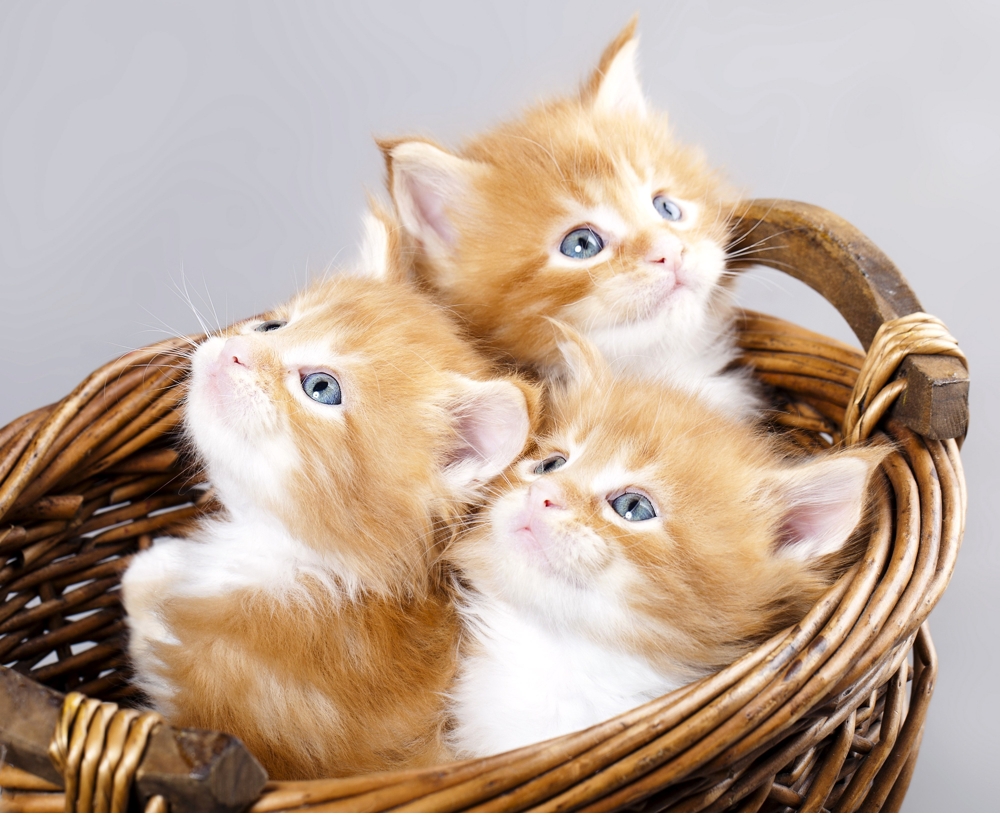

In [24]:
from PIL import Image
image=Image.open("/content/image.jpg")
image

In [25]:
text="cats"
inputs = processor(image, text, return_tensors="pt")

out = model.generate(**inputs)
out_text=processor.decode(out[0], skip_special_tokens=True)
print(out_text)


/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1375: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


cats in a basket


In [26]:
# Load model directly
from transformers import AutoTokenizer, AutoModelForSequenceClassification

tokenizer = AutoTokenizer.from_pretrained("cardiffnlp/twitter-roberta-base-sentiment-latest")
model = AutoModelForSequenceClassification.from_pretrained("cardiffnlp/twitter-roberta-base-sentiment-latest")

Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [27]:
inputs = tokenizer("cats in a basket", return_tensors="pt")
out=model(**inputs)
print(out)

SequenceClassifierOutput(loss=None, logits=tensor([[-0.6784,  1.2987, -1.0013]], grad_fn=<AddmmBackward0>), hidden_states=None, attentions=None)


In [28]:
from transformers import BlipForImageTextRetrieval

model = BlipForImageTextRetrieval.from_pretrained("Salesforce/blip-itm-base-coco")
from transformers import AutoProcessor
processor = AutoProcessor.from_pretrained("Salesforce/blip-itm-base-coco")

In [29]:
import torch
inputs = processor(images=image,
                   text=out_text,
                   return_tensors="pt")

itm_scores = model(**inputs)[0]
itm_score = torch.nn.functional.softmax(
    itm_scores,dim=1)
itm_score

tensor([[0.0539, 0.9461]], grad_fn=<SoftmaxBackward0>)